# Imports

In [1]:
import glob

import numpy as np
import matplotlib.pyplot as plt

from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

from pynistview_utils import *
from selelems import *

import cv2

plt.style.use('dark_background')

# Set up directories and files

In [2]:
# Configure input files

indir = "/Users/rmoraski/Documents/iCloud/School/Electrons/NISTView-ish/"
sempa_file_suffix = 'sempa'

#name = "191001_Fe_whisker/Fe_whisker"
#name = "FeGd_Nov_Dec/171117_FeGd"
#name = "FeGd_Nov_Dec/FeGd100"
#name = "FeGd_Nov_Dec/FeGd200"
name = 'alice/171117_FeGd'

runs = (2, 3)

# Specify the number of features - 1 in the image. This is used to segment and create masks.
segments = 2

# Specify gaussian denoising sigma
sigma = 2

# Specify non-local denoising strength h. Larger h -> more denoising.
h = 20

# Specify a scale for drawing the vector arrows. Smaller number -> longer arrow.
arrow_scale = 0.2

# Specify a color for the vector arrows.
# arrow_color = 'black'
arrow_color = 'white'

# Import files

In [3]:
# Read in image data.

# Get all the i* and m* files. Should end up with 8 of them.

files = np.array([])

for run in runs:
    full_name = name + f'{run:0>3}'

    file = indir + full_name

    files = np.append(files, glob.glob('{}*x*{}'.format(file, sempa_file_suffix)))
    files = np.append(files, glob.glob('{}*y*{}'.format(file, sempa_file_suffix)))
    files = np.append(files, glob.glob('{}*z*{}'.format(file, sempa_file_suffix)))

# ix, ix2, iy, iz
# ix and iy are the same; similarly, ix2 and iz are the same. Ignore 2.
# The two images will be used to align the data

intensity_1, _ = image_data(file_for(files, 'ix.'))
intensity_2, _ = image_data(file_for(files, 'ix2'))

# mx, mx2, my, mz
# Stick with 1, 2, 3 for x, y, z; 4 will be the second x for data scaling

m_1, axis_1 = image_data(file_for(files, 'mx.'))
m_2, axis_2 = image_data(file_for(files, 'my'))
m_3, axis_3 = image_data(file_for(files, 'mz'))
m_4, axis_4 = image_data(file_for(files, 'mx2'))

# Get file dimensions

m_1_ydim, m_1_xdim = m_1.shape
m_2_ydim, m_2_xdim = m_2.shape
m_3_ydim, m_3_xdim = m_3.shape
m_4_ydim, m_4_xdim = m_4.shape

# Extract extrema for later processing

m_1_min, m_1_max = m_1.min(), m_1.max()
m_2_min, m_2_max = m_2.min(), m_2.max()
m_3_min, m_3_max = m_3.min(), m_3.max()
m_4_min, m_4_max = m_4.min(), m_4.max()

# Flatten the intensity images

intensity_1_blurred = median_filter(intensity_1, 3);
intensity_1_flat = intensity_1 - intensity_1_blurred;
intensity_2_blurred = median_filter(intensity_2, 3);
intensity_2_flat = intensity_2 - intensity_2_blurred;

scale = get_scale(files[0])

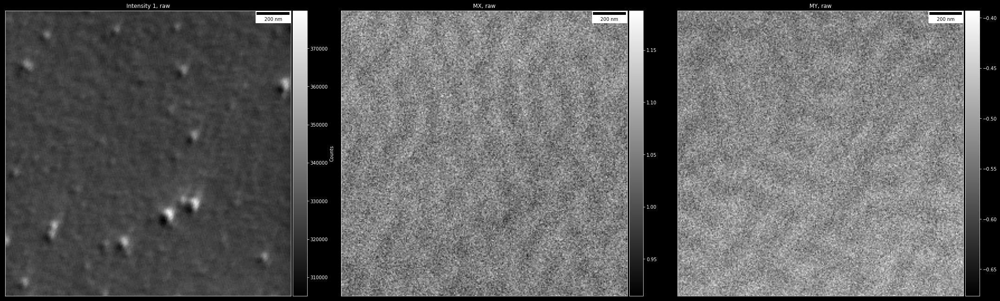

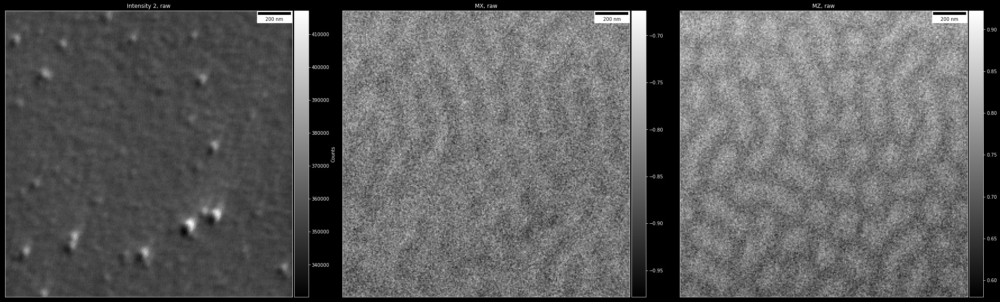

In [4]:
# Have a look at the input files

fig = plt.figure(figsize=(30, 15));

ax1 = show_subplot_raw(intensity_1, 1, 3, 1, 'Intensity 1, raw');
ax1.add_artist(ScaleBar(scale));

# Add a colorbar for counts
sm1 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(intensity_1.min(), intensity_1.max()))
divider1 = make_axes_locatable(ax1);
cax1 = divider1.append_axes('right', size='5%', pad=0.05);
sm1.set_array([]);
cbar1 = plt.colorbar(sm1, cax=cax1, orientation='vertical');
cbar1.set_label('Counts')

ax2 = show_subplot_raw(m_1, 1, 3, 2, 'M{}, raw'.format(axis_1));
ax2.add_artist(ScaleBar(scale));

sm2 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_1_min, m_1_max))
divider2 = make_axes_locatable(ax2);
cax2 = divider2.append_axes('right', size='5%', pad=0.05);
sm2.set_array([]);
cbar2 = plt.colorbar(sm2, cax=cax2, orientation='vertical');
#cbar2.set_label('Counts')

ax3 = show_subplot_raw(m_2, 1, 3, 3, 'M{}, raw'.format(axis_2));
ax3.add_artist(ScaleBar(scale));

sm3 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_2_min, m_2_max))
divider3 = make_axes_locatable(ax3);
cax3 = divider3.append_axes('right', size='5%', pad=0.05);
sm3.set_array([]);
cbar3 = plt.colorbar(sm3, cax=cax3, orientation='vertical');
#cbar3.set_label('Counts')

plt.tight_layout();

fig = plt.figure(figsize=(30, 15));

ax1 = show_subplot_raw(intensity_2, 1, 3, 1, 'Intensity 2, raw');
ax1.add_artist(ScaleBar(scale));

# Add a colorbar for counts
sm1 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(intensity_2.min(), intensity_2.max()))
divider1 = make_axes_locatable(ax1);
cax1 = divider1.append_axes('right', size='5%', pad=0.05);
sm1.set_array([]);
cbar1 = plt.colorbar(sm1, cax=cax1, orientation='vertical');
cbar1.set_label('Counts')

ax2 = show_subplot_raw(m_4, 1, 3, 2, 'M{}, raw'.format(axis_4));
ax2.add_artist(ScaleBar(scale));

sm2 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_4_min, m_4_max))
divider2 = make_axes_locatable(ax2);
cax2 = divider2.append_axes('right', size='5%', pad=0.05);
sm2.set_array([]);
cbar2 = plt.colorbar(sm2, cax=cax2, orientation='vertical');
#cbar2.set_label('Counts')

ax3 = show_subplot_raw(m_3, 1, 3, 3, 'M{}, raw'.format(axis_3));
ax3.add_artist(ScaleBar(scale));

sm3 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_3_min, m_3_max))
divider3 = make_axes_locatable(ax3);
cax3 = divider3.append_axes('right', size='5%', pad=0.05);
sm3.set_array([]);
cbar3 = plt.colorbar(sm3, cax=cax3, orientation='vertical');
#cbar3.set_label('Counts')

plt.tight_layout();

# Align scans

Get the 2 ix images aligned as best possible

In [6]:
results_r, results_h, h, imMatches, imKeypoints = align_and_scale(intensity_1, intensity_2, m_1, m_2, m_3, m_4)
intensity_1_r, intensity_2_r, m_1_r, m_2_r, m_3_r, m_4_r = results_r
intensity_1_h, m_1_h, m_2_h = results_h

[[ 9.69435335e-01  3.08019272e-02  1.34435555e+01]
 [-5.19253058e-02  9.89719473e-01  1.46215712e+01]
 [-2.46508302e-04  9.34645616e-05  1.00000000e+00]]


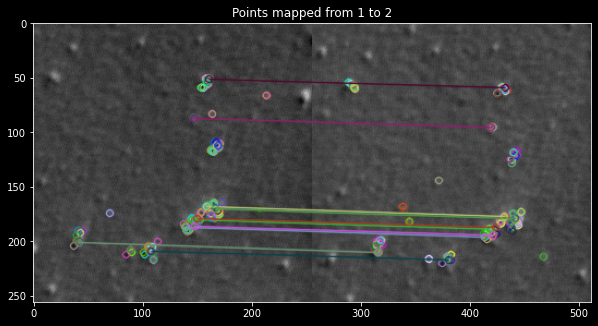

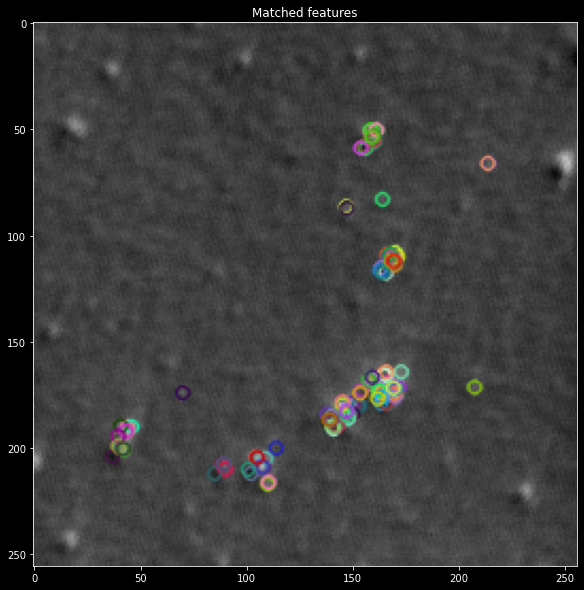

In [7]:
plt.figure(figsize=(10, 10));
plt.imshow(imMatches);
plt.title('Points mapped from 1 to 2');

plt.figure(figsize=(10, 10));
plt.imshow(imKeypoints);
plt.title('Matched features');

print(h)

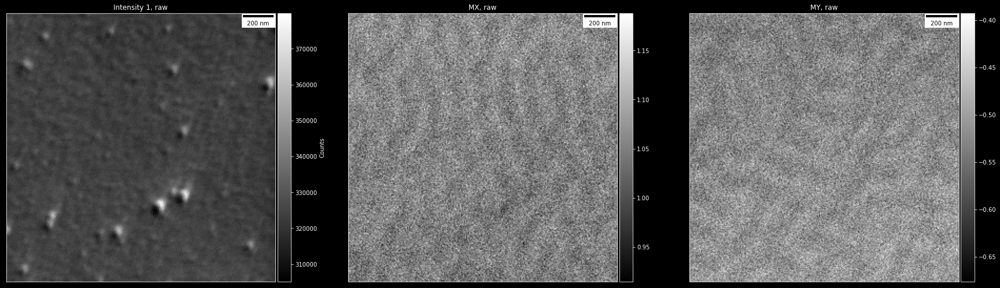

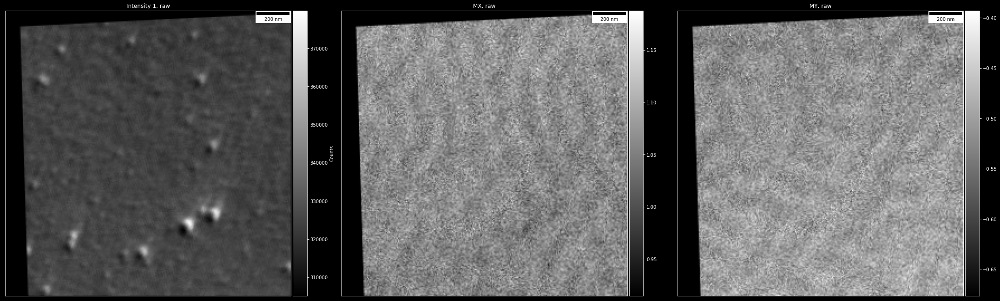

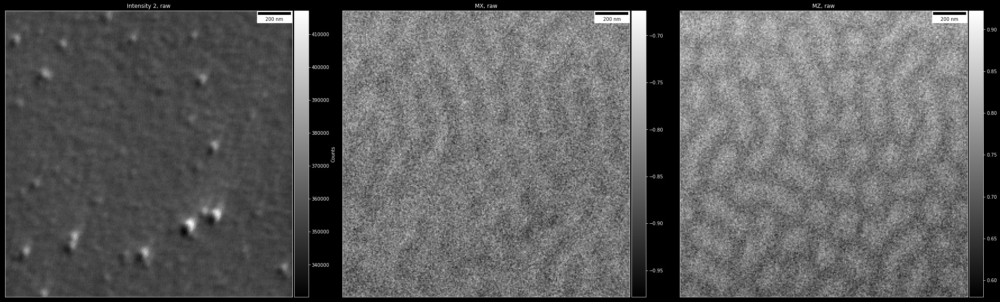

In [8]:
# Have a look at the input files

fig = plt.figure(figsize=(30, 15));

ax1 = show_subplot_raw(intensity_1, 1, 3, 1, 'Intensity 1, raw');
ax1.add_artist(ScaleBar(scale));

# Add a colorbar for counts
sm1 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(intensity_1.min(), intensity_1.max()))
divider1 = make_axes_locatable(ax1);
cax1 = divider1.append_axes('right', size='5%', pad=0.05);
sm1.set_array([]);
cbar1 = plt.colorbar(sm1, cax=cax1, orientation='vertical');
cbar1.set_label('Counts')

ax2 = show_subplot_raw(m_1, 1, 3, 2, 'M{}, raw'.format(axis_1));
ax2.add_artist(ScaleBar(scale));

sm2 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_1_min, m_1_max))
divider2 = make_axes_locatable(ax2);
cax2 = divider2.append_axes('right', size='5%', pad=0.05);
sm2.set_array([]);
cbar2 = plt.colorbar(sm2, cax=cax2, orientation='vertical');
#cbar2.set_label('Counts')

ax3 = show_subplot_raw(m_2, 1, 3, 3, 'M{}, raw'.format(axis_2));
ax3.add_artist(ScaleBar(scale));

sm3 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_2_min, m_2_max))
divider3 = make_axes_locatable(ax3);
cax3 = divider3.append_axes('right', size='5%', pad=0.05);
sm3.set_array([]);
cbar3 = plt.colorbar(sm3, cax=cax3, orientation='vertical');


fig = plt.figure(figsize=(30, 15));

ax1 = show_subplot_raw(intensity_1_h, 1, 3, 1, 'Intensity 1, raw');
ax1.add_artist(ScaleBar(scale));

# Add a colorbar for counts
sm1 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(intensity_1.min(), intensity_1.max()))
divider1 = make_axes_locatable(ax1);
cax1 = divider1.append_axes('right', size='5%', pad=0.05);
sm1.set_array([]);
cbar1 = plt.colorbar(sm1, cax=cax1, orientation='vertical');
cbar1.set_label('Counts')

ax2 = show_subplot_raw(m_1_h, 1, 3, 2, 'M{}, raw'.format(axis_1));
ax2.add_artist(ScaleBar(scale));

sm2 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_1_min, m_1_max))
divider2 = make_axes_locatable(ax2);
cax2 = divider2.append_axes('right', size='5%', pad=0.05);
sm2.set_array([]);
cbar2 = plt.colorbar(sm2, cax=cax2, orientation='vertical');
#cbar2.set_label('Counts')

ax3 = show_subplot_raw(m_2_h, 1, 3, 3, 'M{}, raw'.format(axis_2));
ax3.add_artist(ScaleBar(scale));

sm3 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_2_min, m_2_max))
divider3 = make_axes_locatable(ax3);
cax3 = divider3.append_axes('right', size='5%', pad=0.05);
sm3.set_array([]);
cbar3 = plt.colorbar(sm3, cax=cax3, orientation='vertical');
#cbar3.set_label('Counts')

plt.tight_layout();

fig = plt.figure(figsize=(30, 15));

ax1 = show_subplot_raw(intensity_2, 1, 3, 1, 'Intensity 2, raw');
ax1.add_artist(ScaleBar(scale));

# Add a colorbar for counts
sm1 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(intensity_2.min(), intensity_2.max()))
divider1 = make_axes_locatable(ax1);
cax1 = divider1.append_axes('right', size='5%', pad=0.05);
sm1.set_array([]);
cbar1 = plt.colorbar(sm1, cax=cax1, orientation='vertical');
cbar1.set_label('Counts')

ax2 = show_subplot_raw(m_4, 1, 3, 2, 'M{}, raw'.format(axis_4));
ax2.add_artist(ScaleBar(scale));

sm2 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_4_min, m_4_max))
divider2 = make_axes_locatable(ax2);
cax2 = divider2.append_axes('right', size='5%', pad=0.05);
sm2.set_array([]);
cbar2 = plt.colorbar(sm2, cax=cax2, orientation='vertical');
#cbar2.set_label('Counts')

ax3 = show_subplot_raw(m_3, 1, 3, 3, 'M{}, raw'.format(axis_3));
ax3.add_artist(ScaleBar(scale));

sm3 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_3_min, m_3_max))
divider3 = make_axes_locatable(ax3);
cax3 = divider3.append_axes('right', size='5%', pad=0.05);
sm3.set_array([]);
cbar3 = plt.colorbar(sm3, cax=cax3, orientation='vertical');
#cbar3.set_label('Counts')

plt.tight_layout();

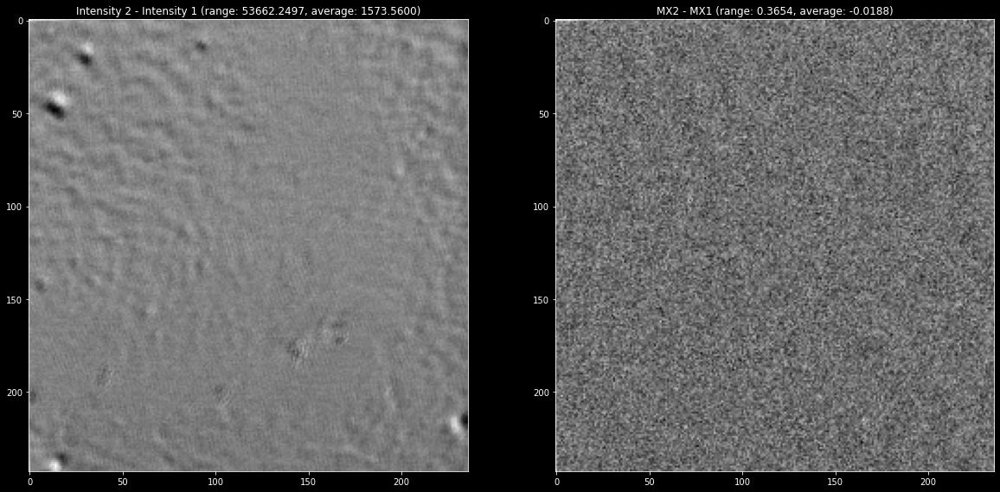

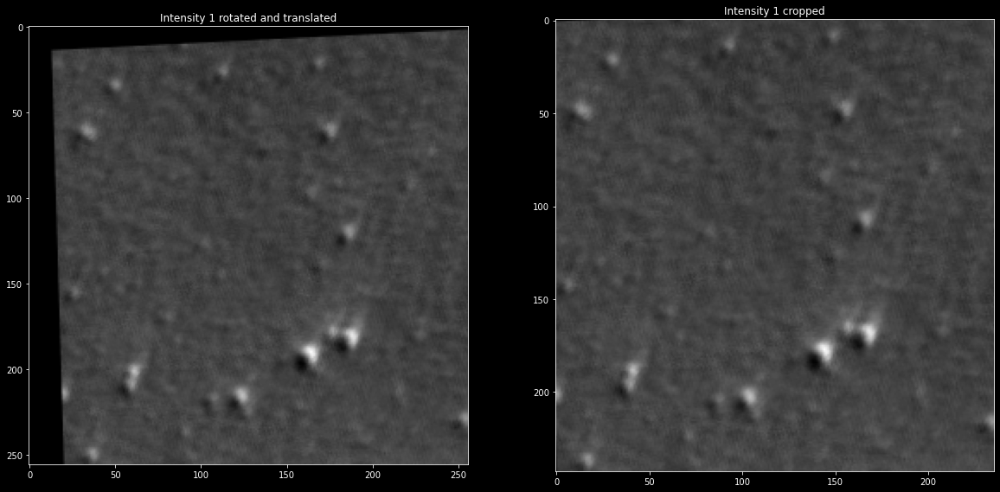

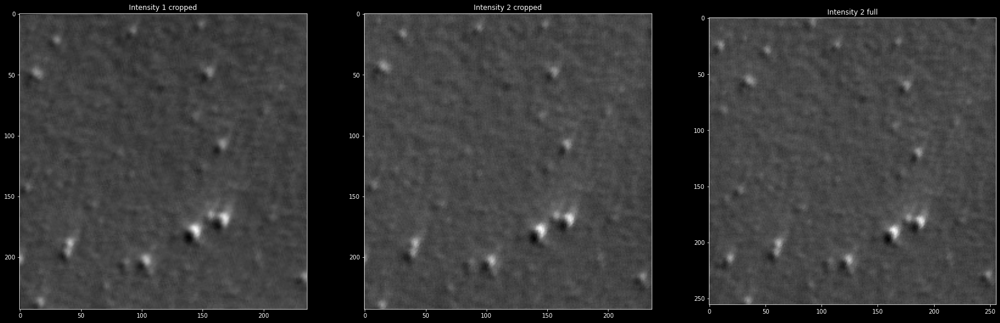

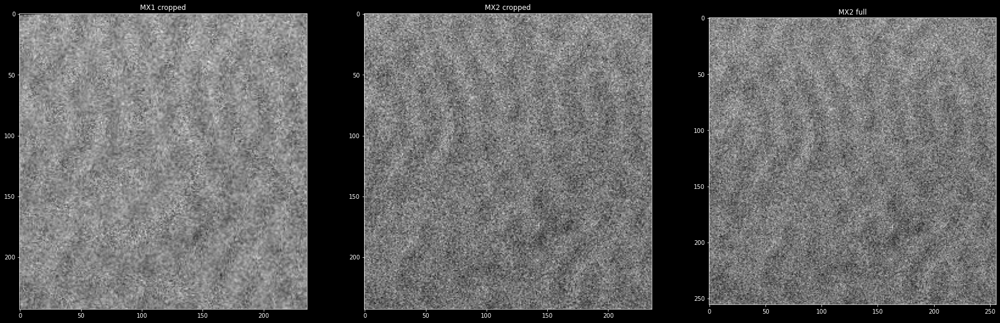

In [11]:
intensity_2_scaled_to_1 = rescale_to(intensity_2_r, intensity_1_r)
m_4_scaled_to_1 = rescale_to(m_4_r, m_1_r)
difference_im = intensity_2_scaled_to_1 - intensity_1_r
difference_mx = m_4_scaled_to_1 - m_1_r

plt.figure(figsize=(20, 10));
plt.subplot(1, 2, 1);
plt.imshow(difference_im, cmap='gray');
plt.title('Intensity 2 - Intensity 1 (range: {:.4f}, average: {:.4f})'.format(np.ptp(difference_im), np.average(difference_im)));
plt.subplot(1, 2, 2);
plt.imshow(difference_mx, cmap='gray');
plt.title('MX2 - MX1 (range: {:.4f}, average: {:.4f})'.format(np.ptp(difference_mx), np.average(difference_mx)));

plt.figure(figsize=(20, 10));
plt.subplot(1, 2, 1);
plt.imshow(intensity_1_h, cmap='gray');
plt.title('Intensity 1 rotated and translated');
plt.subplot(1, 2, 2);
plt.imshow(intensity_1_r, cmap='gray');
plt.title('Intensity 1 cropped')

plt.figure(figsize=(30, 10));
plt.subplot(1, 3, 1);
plt.imshow(intensity_1_r, cmap='gray');
plt.title('Intensity 1 cropped')
plt.subplot(1, 3, 2);
plt.imshow(intensity_2_r, cmap='gray');
plt.title('Intensity 2 cropped')
plt.subplot(1, 3, 3);
plt.imshow(intensity_2, cmap='gray');
plt.title('Intensity 2 full');

plt.figure(figsize=(30, 10));
plt.subplot(1, 3, 1);
plt.imshow(m_1_r, cmap='gray');
plt.title('MX1 cropped')
plt.subplot(1, 3, 2);
plt.imshow(m_4_r, cmap='gray');
plt.title('MX2 cropped')
plt.subplot(1, 3, 3);
plt.imshow(m_4, cmap='gray');
plt.title('MX2 full');

# Find offsets

The imaging components do not use the same zero point. Since the magnetization vector should have the same magnitude over the entire sample, minimize the min to max spread across the combined images.

In [ ]:
# Minimize the min to max spread on the magnitudes of the combines images. Use CoM for a starting point.

offsets, status, message = find_offsets(m_1_fitted_denoised, m_2_fitted_denoised)
m_1_offset, m_2_offset = offsets

print('Found offsets: {}'.format(offsets))
print('Status code {}: {}'.format(status, message))
print("Raw files' ptp: {:.5f}".format(np.ptp(get_magnitudes(m_1, m_2))))
print("Offset files' ptp: {:.5f}".format(np.ptp(get_magnitudes(m_1_fitted_denoised - offsets[0], m_2_fitted_denoised - offsets[1]))))

In [14]:
m_1_average, m_2_average = np.average(m_1), np.average(m_2)
m_1_shifted, m_2_shifted = m_1 - m_1_average, m_2 - m_2_average
(m_1_offset, m_2_offset), status, message = find_offsets(m_1_shifted, m_2_shifted)
m_1_adjusted, m_2_adjusted = m_1_shifted + m_1_offset, m_2_shifted + m_2_offset

print('M{} offset: {:.4f}, M{} offset: {:.4f}'.format(axis_1, m_1_average + m_1_offset, axis_2, m_2_average + m_2_offset))

MX offset: 1.0428, MY offset: -0.5309


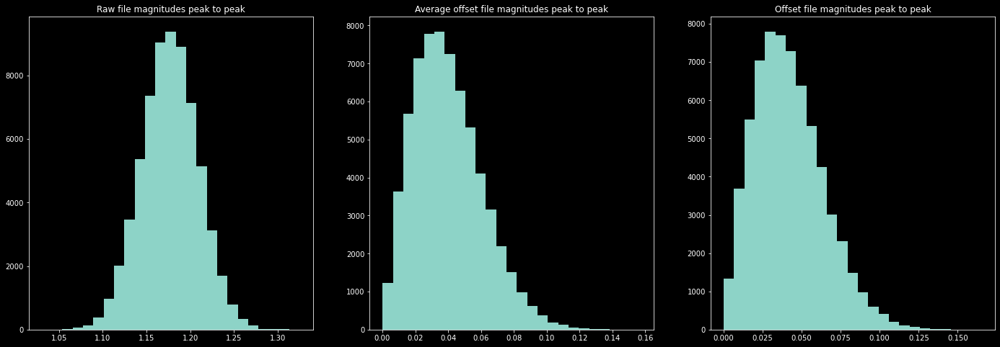

In [15]:
plt.figure(figsize=(24, 8));
plt.subplot(1, 3, 1);
plt.hist(get_magnitudes(m_1, m_2).ravel(), bins=25);
plt.title('Raw file magnitudes peak to peak');
plt.subplot(1, 3, 2);
plt.hist(get_magnitudes(m_1_shifted, m_2_shifted).ravel(), bins=25);
plt.title('Average offset file magnitudes peak to peak');
plt.subplot(1, 3, 3);
plt.hist(get_magnitudes(m_1_adjusted, m_2_adjusted).ravel(), bins=25);
plt.title('Offset file magnitudes peak to peak');

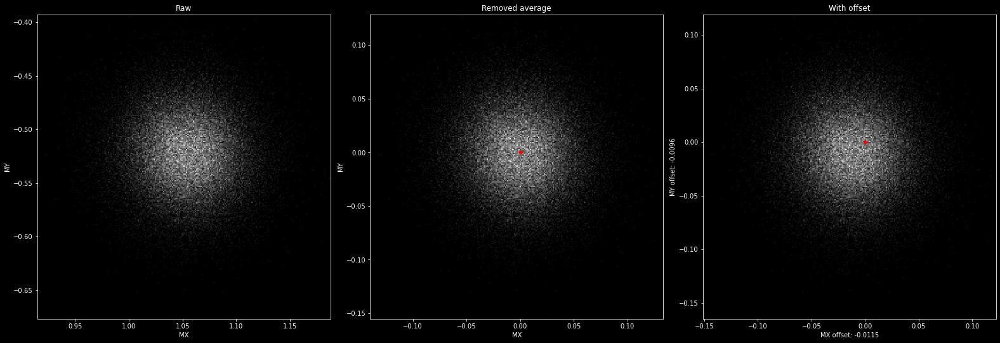

In [17]:
fig = plt.figure(figsize=(22, 8));
ax1 = fig.add_subplot(1, 3, 1);
ax2 = fig.add_subplot(1, 3, 2);
ax3 = fig.add_subplot(1, 3, 3);

ax1.hist2d(m_1.ravel(), m_2.ravel(), bins=256, cmap='gray');
ax1.set_xlabel('M{}'.format(axis_1));
ax1.set_ylabel('M{}'.format(axis_2));
ax1.set_title('Raw');
ax1.set_aspect('equal');

ax2.hist2d(m_1_shifted.ravel(), m_2_shifted.ravel(), bins=256, cmap='gray');
ax2.plot(0, 0, 'r.', ms=10);
ax2.set_xlabel('M{}'.format(axis_1));
ax2.set_ylabel('M{}'.format(axis_2));
ax2.set_title('Removed average');
ax2.set_aspect('equal');

ax3.hist2d(m_1_adjusted.ravel(), m_2_adjusted.ravel(), bins=256, cmap='gray');
ax3.plot(0, 0, 'r.', ms=10);
ax3.set_xlabel('M{} offset: {:.4f}'.format(axis_1, m_1_offset));
ax3.set_ylabel('M{} offset: {:.4f}'.format(axis_2, m_2_offset));
ax3.set_title('With offset');
ax3.set_aspect('equal');

plt.tight_layout();

# Apply offsets

In [ ]:
# Apply offsets

m_1_denoised, m_2_denoised = m_1_fitted_denoised - m_1_offset, m_2_fitted_denoised - m_2_offset

print('M{} denoised - min: {:.2f}, max: {:.2f}, average: {:.2f}, PtP: {:.2f}'.format(
    axis_1, m_1_denoised.min(), m_1_denoised.max(), np.average(m_1_denoised), np.ptp(m_1_denoised)))
print('M{} denoised - min: {:.2f}, max: {:.2f}, average: {:.2f}, PtP: {:.2f}'.format(
    axis_2, m_2_denoised.min(), m_2_denoised.max(), np.average(m_2_denoised), np.ptp(m_2_denoised)))

# Remove gradients

Imperfections in the imaging components might leave undesirable gradient artifacts in the image.

## Remove line errors

In [ ]:
m_1_delined, m_2_delined = remove_line_errors(m_1, 20), remove_line_errors(m_2, 20)
m_1_delined, m_2_delined = rescale_to(m_1_delined, m_1), rescale_to(m_2_delined, m_2)

In [ ]:
plt.figure(figsize=(20, 20));
plt.subplot(2, 2, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{}'.format(axis_1));
plt.subplot(2, 2, 2);
plt.imshow(m_2, cmap='gray');
plt.title('M{}'.format(axis_2));
plt.subplot(2, 2, 3);
plt.imshow(m_1_delined, cmap='gray');
plt.title('M{} with line errors removed'.format(axis_1));
plt.subplot(2, 2, 4);
plt.imshow(m_2_delined, cmap='gray');
plt.title('M{} with line errors removed'.format(axis_2));

## Mean shift

This is used to improve image segmentation

In [ ]:
# m_1_shift, m_2_shift = mean_shift_filter(m_1_delined), mean_shift_filter(m_2_delined)
m_1_shift, m_2_shift = mean_shift_filter(m_1), mean_shift_filter(m_2)
m_4_shift, m_3_shift = mean_shift_filter(m_4), mean_shift_filter(m_3)

In [ ]:
plt.figure(figsize=(20, 20));
plt.subplot(2, 2, 1);
plt.imshow(m_1_shift, cmap='gray');
plt.title('M{}'.format(axis_1));

plt.subplot(2, 2, 2);
plt.imshow(m_2_shift, cmap='gray');
plt.title('M{}'.format(axis_2));

plt.subplot(2, 2, 3);
plt.imshow(m_4_shift, cmap='gray');
plt.title('M{}'.format(axis_4));

plt.subplot(2, 2, 4);
plt.imshow(m_3_shift, cmap='gray');
plt.title('M{}'.format(axis_3));

## Segment

Find the features in the images

In [ ]:
m_1_thresh, m_1_seg, m_1_masks = segment_image(m_1_shift, segments=segments)
m_2_thresh, m_2_seg, m_2_masks = segment_image(m_2_shift, segments=segments)
m_3_thresh, m_3_seg, m_3_masks = segment_image(m_3_shift, segments=segments)
m_4_thresh, m_4_seg, m_4_masks = segment_image(m_4_shift, segments=segments)

In [ ]:
plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_1_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_1_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_1_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_1_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_1 * m_1_masks[0, 0], vmin=m_1_min, vmax=m_1_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_1 * m_1_masks[0, 1], vmin=m_1_min, vmax=m_1_max, cmap='gray');
plt.title('Area 2 masked');

plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_2_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_2_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_2_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_2_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_2 * m_2_masks[0, 0], vmin=m_2_min, vmax=m_2_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_2 * m_2_masks[0, 1], vmin=m_2_min, vmax=m_2_max, cmap='gray');
plt.title('Area 2 masked');

plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_3_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_3_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_3_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_3_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_3 * m_3_masks[0, 0], vmin=m_3_min, vmax=m_3_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_3 * m_3_masks[0, 1], vmin=m_3_min, vmax=m_3_max, cmap='gray');
plt.title('Area 2 masked');

plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_4_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_4_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_4_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_4_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_4 * m_4_masks[0, 0], vmin=m_4_min, vmax=m_4_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_4 * m_4_masks[0, 1], vmin=m_4_min, vmax=m_4_max, cmap='gray');
plt.title('Area 2 masked');

## Fit images

Find a polynomial fit for the images and remove the background gradient

In [ ]:
# m_1 first
m_1_light_mask, m_1_dark_mask = m_1_masks[0, 0], m_1_masks[0, 1]

m_1_light_fit_all, m_1_light_fit = fit_image(m_1, m_1_light_mask)
m_1_dark_fit_all, m_1_dark_fit = fit_image(m_1, m_1_dark_mask)

m_1_light_fitted, m_1_dark_fitted = m_1 - m_1_light_fit_all, m_1 - m_1_dark_fit_all

# and m_2
m_2_light_mask, m_2_dark_mask = m_2_masks[0, 0], m_2_masks[0, 1]

m_2_light_fit_all, m_2_light_fit = fit_image(m_2, m_2_light_mask)
m_2_dark_fit_all, m_2_dark_fit = fit_image(m_2, m_2_dark_mask)

m_2_light_fitted, m_2_dark_fitted = m_2 - m_2_light_fit_all, m_2 - m_2_dark_fit_all


# Rescale both
m_1_light_fitted, m_2_light_fitted = rescale_to(m_1_light_fitted, m_1), rescale_to(m_2_light_fitted, m_2)

In [ ]:
plt.figure(figsize=(30, 20));

plt.subplot(2, 3, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{} original'.format(axis_1));
plt.subplot(2, 3, 2);
plt.imshow(m_1_light_fit_all, cmap='gray');
plt.title('1st fit');
plt.subplot(2, 3, 3);
plt.imshow(m_1_dark_fit_all, cmap='gray');
plt.title('2nd fit');
plt.subplot(2, 3, 5);
plt.imshow(m_1_light_fitted, cmap='gray');
plt.title('Subtracted 1st fit');
plt.subplot(2, 3, 6);
plt.imshow(m_1 - m_1_dark_fit_all, cmap='gray');
plt.title('Subtracted 2nd fit');

plt.figure(figsize=(30, 20));
plt.subplot(2, 3, 1);
plt.imshow(m_2, cmap='gray');
plt.title('M{} original'.format(axis_2));
plt.subplot(2, 3, 2);
plt.imshow(m_2_light_fit_all, cmap='gray');
plt.title('1st fit');
plt.subplot(2, 3, 3);
plt.imshow(m_2_dark_fit_all, cmap='gray');
plt.title('2nd fit');
plt.subplot(2, 3, 5);
plt.imshow(m_2_light_fitted, cmap='gray');
plt.title('Subtracted 1st fit');
plt.subplot(2, 3, 6);
plt.imshow(m_2 - m_2_dark_fit_all, cmap='gray');
plt.title('Subtracted 2nd fit');

# Remove noise

In [ ]:
m_1_fitted_denoised, m_1_fitted_denoised_blurred = clean_image(m_1_light_fitted, sigma=sigma, h=h)
m_2_fitted_denoised, m_2_fitted_denoised_blurred = clean_image(m_2_light_fitted, sigma=sigma, h=h)

In [ ]:
plt.figure(figsize=(20, 10));

plt.subplot(1, 2, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{} original'.format(axis_1));
plt.subplot(1, 2, 2);
plt.imshow(m_1_fitted_denoised, cmap='gray');
plt.title('Denoised fit for M{}'.format(axis_1));

plt.figure(figsize=(20, 10));

plt.subplot(1, 2, 1);
plt.imshow(m_2, cmap='gray');
plt.title('M{} original'.format(axis_2));
plt.subplot(1, 2, 2);
plt.imshow(m_2_fitted_denoised, cmap='gray');
plt.title('Denoised fit for M{}'.format(axis_2));

In [ ]:
# Extract phase and magnitude information

phases = get_phases(m_1_denoised, m_2_denoised)
magnitudes = get_magnitudes(m_1_denoised, m_2_denoised)
magnitudes /= magnitudes.max()
print('Phase spectrum for run {}: {:.6f} - {:.6f} ({:.3f}º - {:.3f}º)'.format(
    run, phases.min(), phases.max(), phases.min() * 180 / np.pi, phases.max() * 180 / np.pi))

# Display results

In [ ]:
# Show a colorized version of the domains

img = render_phases_and_magnitudes(magnitudes, phases)

In [ ]:
np.min(img), np.max(img), np.min(phases), np.max(phases), np.min(magnitudes), np.max(magnitudes)

In [ ]:
display_results(img, m_1_denoised, m_1_light_fitted - m_1_offset, m_2_denoised, m_2_light_fitted - m_2_offset, intensity_1_flat, scale, full_name, arrow_scale=arrow_scale * 4, arrow_color=arrow_color, axis_1=axis_1, axis_2=axis_2)

In [ ]:
save_file(file, intensity_flat, img, axis_1, axis_2, scale, img_denoised_1=m_1_denoised,
          img_denoised_2=m_2_denoised, arrow_color=arrow_color, arrow_scale=arrow_scale)